In [23]:
from scipy import ndimage as ndi
from scipy.ndimage.filters import gaussian_filter
from scipy.ndimage import median_filter
from scipy.spatial import ConvexHull, convex_hull_plot_2d
import matplotlib.pyplot as plt
from skimage.feature import peak_local_max
from skimage import img_as_float
from PIL import Image
from shapely.geometry import Point
from shapely.geometry.polygon import Polygon
from shapely.affinity import scale

import laspy
from sklearn.cluster import DBSCAN
import numpy
import os
import cv2
import matplotlib.pyplot as plt
%matplotlib inline  
from tqdm import tqdm
import coord_f
import folium
import visualize
import db_settings
import geopandas
import pandas



In [2]:
#ganz schlecht klassifiziet:3dm_32_330_5726_1_nw.las

las_files=["11_perc_3dm_32_330_5723_1_nw.las", "3dm_32_331_5722_1_nw.las","3dm_32_338_5725_1_nw.las", "3dm_32_337_5727_1_nw.las", "3dm_32_337_5726_1_nw.las","3dm_32_337_5725_1_nw.las"]
folder = "lidar-files/test"
las_file = folder+ "/" + las_files[0]
las = laspy.read(las_file)
#setze größe der geplotteten bilder:
plt.rcParams['figure.figsize'] = [5, 5]



#setze größe der geplotteten bilder:
plt.rcParams['figure.figsize'] = [20, 20]

#43 Bäume laut kataster

In [3]:
las_points_x = numpy.array(las.points['x']) 
las_points_y = numpy.array(las.points['y'])
x_max, x_min, y_max, y_min = las_points_x.max(),  las_points_x.min(), las_points_y.max(),  las_points_y.min()
x_range = x_max - x_min
y_range = y_max - y_min
print(x_max, x_min,x_range, y_max, y_min, y_range)

331000.01 329999.98 1000.0300000000279 5724000.01 5722999.98 1000.0299999993294


0 Nie klassifiziert
1 Nicht zugewiesen
2 Oberfläche
3 Niedrige Vegetation
4 Mittelhohe Vegetation
5 Hohe Vegetation
6 Gebäude
7 Tiefpunkt
8 Reserviert
9 Wasser
10 Schienen
11 Straßenbelag
12 Reserviert
13 Schutzdraht (Schild)
14 Drahtleiter (Phase)
15 Strommast
16 Leitungsverbinder (Isolator)
17 Brückenfahrbahn
18 Hohes Rauschen

In [4]:
length = len(las.points['x'])
#points_to_cluster = numpy.zeros((length,3))
#points_to_cluster = numpy.array(list(map(lambda a, x,y,z,c : [x,y,z] if c == 5 else [None, None, None],tqdm(points_to_cluster), las.points['x'], las.points['y'], las.points['z'], las.points['classification'])))
#print(points_to_cluster)
classes_to_cluster = [5]
points_to_cluster = numpy.array([[las.points['x'][i], las.points['y'][i], las.points['z'][i]] for i in tqdm(range(length)) if (las.points['classification'][i] in classes_to_cluster)]) 
indices_of_cluster_points = numpy.array([i for i in tqdm(range(length)) if (las.points['classification'][i] in classes_to_cluster)]) 

#for i, l in tqdm(zip(indices_of_cluster_points, labels)):
#    if l == -1:
#        las.points['classification'][i] = 1 
#


100%|██████████| 9805369/9805369 [02:04<00:00, 78707.79it/s]


In [5]:
print("#####")
#p =points_to_cluster[:][:][:]
#i =points_to_cluster[:][3]


#####


In [6]:

points_to_cluster2d = points_to_cluster[:,:2]
print(points_to_cluster2d)

[[ 330159.64 5723013.68]
 [ 330160.   5723013.35]
 [ 330155.99 5723019.18]
 ...
 [ 330986.52 5723603.12]
 [ 330986.62 5723603.64]
 [ 330986.41 5723603.47]]


In [7]:
cluster = DBSCAN(eps=0.6, min_samples=5).fit(points_to_cluster2d)  # parameters according to https://www.degruyter.com/document/doi/10.1515/geo-2020-0266/html?lang=de
labels = cluster.labels_

In [8]:
print(labels)
colors = visualize.label_to_color_map(labels)
colors2 = visualize.merge_class_with_labels(points_to_cluster, labels, indices_of_cluster_points, las.points['classification'])



[   0    0   -1 ... 1813 1813 1813]


100%|██████████| 1814/1814 [00:00<00:00, 309753.18it/s]


label_colors (1814, 3)


100%|██████████| 970389/970389 [00:02<00:00, 483295.34it/s]


colorize points by classification-number:


100%|██████████| 9805369/9805369 [02:08<00:00, 76334.09it/s]


painting clusters:


100%|██████████| 970389/970389 [00:00<00:00, 1354496.58it/s]


In [9]:
visualize.draw_point_cloud(points_to_cluster, colors)

visualize.draw_point_cloud(numpy.array([las.points['x'],las.points['y'],las.points['z']]).transpose(), colors2)

In [10]:
cluster_dict = {}
for i in range(max(labels) +1):
    if i >= 0:
        cluster_dict[i] = []
for i, p in tqdm(zip(labels, points_to_cluster)):
    #drop not clustered points with label -1:
    if i >= 0:
        cluster_dict[i] =  cluster_dict[i] + [p]


980777it [02:30, 6513.70it/s]  


In [11]:
lat,long = coord_f.utm_to_lat_long(x_max, y_max)
lat_min,long_min = coord_f.utm_to_lat_long(x_min, y_min)

f_map = folium.Map(location=[lat, long], zoom_start=14)
#add las area:
folium.Marker(location=[lat, long],icon=folium.Icon(color="red")).add_to( f_map )
folium.Marker(location=[lat_min, long_min],icon=folium.Icon(color="red")).add_to( f_map )
folium.Marker(location=[lat, long_min],icon=folium.Icon(color="red")).add_to( f_map )
folium.Marker(location=[lat_min, long],icon=folium.Icon(color="red")).add_to( f_map )




for values in cluster_dict.values():
    center = numpy.array(values).mean(axis=0)
    lat, long = coord_f.utm_to_lat_long(center[0], center[1])
    folium.Marker(location=[lat, long],icon=folium.Icon(color="green")).add_to( f_map )
    
#for lat, long in latlong_coordinates:
#    folium.Marker(location=[lat, long],icon=folium.Icon(color="green")).add_to( f_map )

f_map

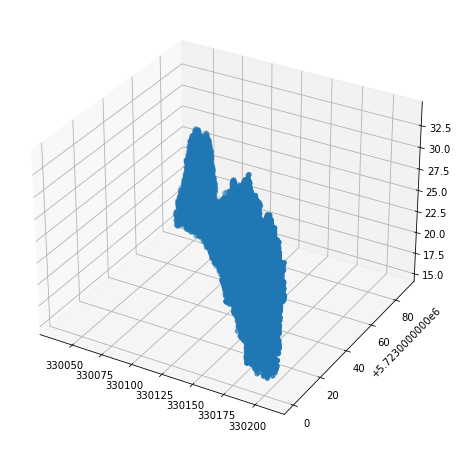

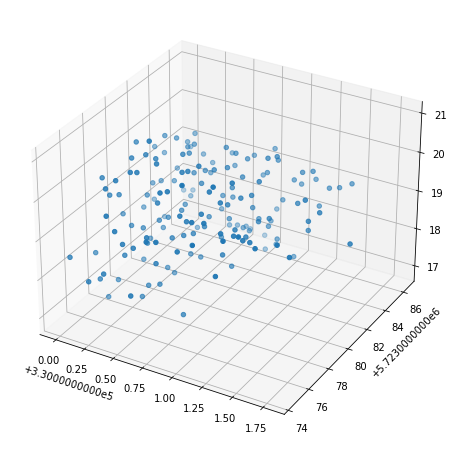

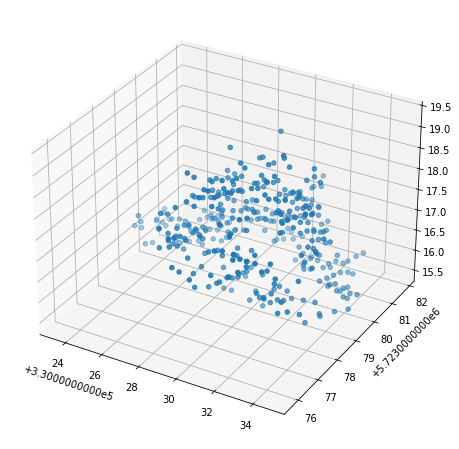

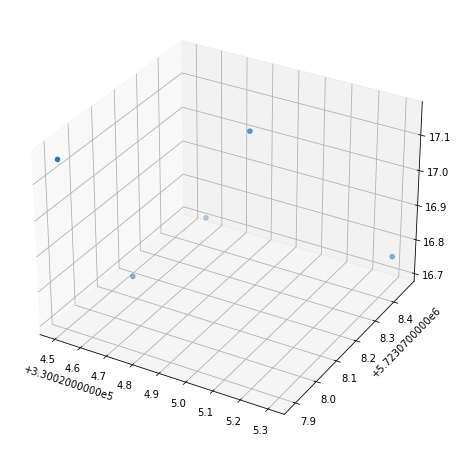

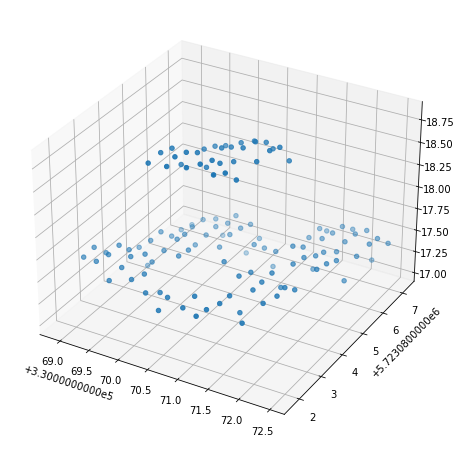

...

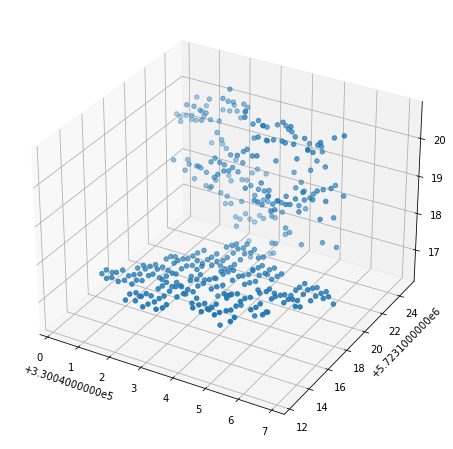

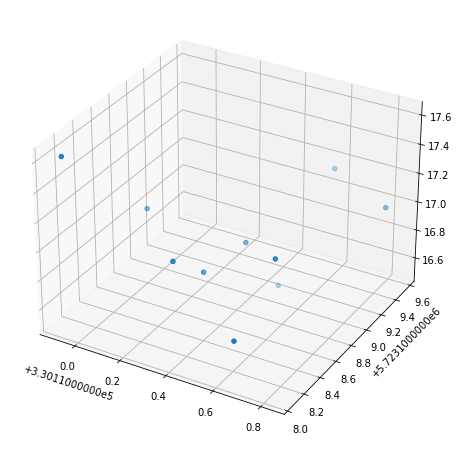

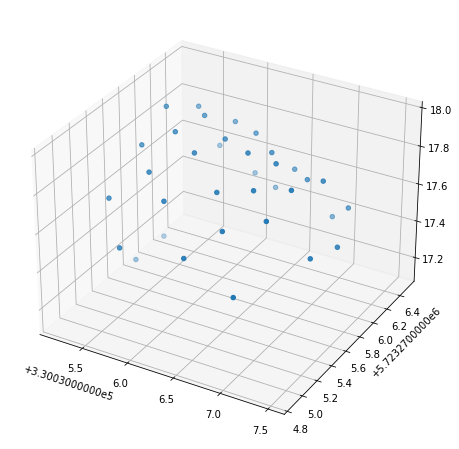

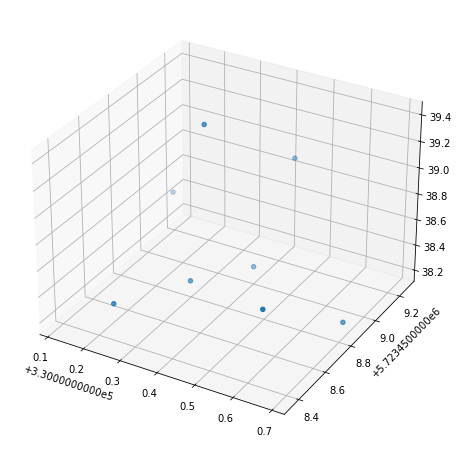

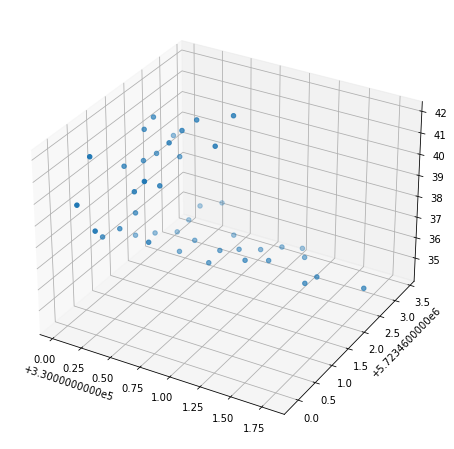

In [12]:
# plot first 20 cluster:

for i in range(20):
    points = cluster_dict[i]
    #MultiPoint(points)
    x = [point[0] for point in points]
    y = [point[1] for point in points]
    z = [point[2] for point in points]

    #plt.scatter(xs, ys)
    fig = plt.figure(figsize=(8, 8))
    ax = fig.add_subplot(111, projection='3d')
    ax.scatter(x, y, z)
    plt.show()

In [39]:
#x/y-convex hull
hull_dict = {}
for key in cluster_dict.keys():
    tree = numpy.array(cluster_dict[key]).transpose((1, 0))
    x = tree[0]
    y = tree[1]    
    points_2d = numpy.array([x,y]).transpose()
    
    if len(points_2d) > 150:
        hull = ConvexHull(points_2d)
        poly = Polygon(points_2d[hull.vertices])
        poly = scale(poly, xfact=1.1,yfact=1.1)
        hull_dict[key] = poly
        """

        fig, (ax1, ax2) = plt.subplots(ncols=2, figsize=(10, 3))

        for ax in (ax1, ax2):
            ax.plot(points_2d[:, 0], points_2d[:, 1], '.', color='k')
            if ax == ax1:
                ax.set_title('Given points')
            else:
                ax.set_title('Convex hull')
                for simplex in hull.simplices:
                    ax.plot(points_2d[simplex, 0], points_2d[simplex, 1], 'c')
                ax.plot(points_2d[hull.vertices, 0], points_2d[hull.vertices, 1], 'o', mec='r', color='none', lw=1, markersize=10)
        plt.show()
        """        

    

In [40]:
#db lockup baumkataster
db =db_settings.db(autocommit=False)

db_file_name = las_file.split('.')[0].split('/')[-1] + '.laz'
db_file_name = db_file_name[8:]
print(db_file_name)
req = """SELECT ID FROM LIDAR.LIDAR_FILES WHERE FILE_NAME = \'"""+db_file_name+"""\'"""
lidar_file_number = db.export_to_pandas(req)

trees =db.export_to_pandas("""SELECT * FROM BAEUME.BAEUME WHERE STADT=""" + str(3)) #+"""and LIDAR_FILE="""+str(lidar_file_number['ID'].values[0])+"""ORDER BY id""")
print(trees)

print(lidar_file_number)


3dm_32_330_5723_1_nw.laz
           ID              X             Y  STADT  GATTUNG  LIDAR_FILE
0       95461  335555.629525  5.726000e+06      3      116         110
1       95463  335548.758934  5.725993e+06      3      116         110
2       95467  335456.277944  5.725556e+06      3       81         110
3       95468  335249.108464  5.725540e+06      3       81         110
4       95470  335278.573820  5.725545e+06      3       81         110
...       ...            ...           ...    ...      ...         ...
13791  109222  338517.807006  5.727119e+06      3       90         138
13792  109225  337144.856136  5.724917e+06      3      116         127
13793  109234  336776.371768  5.728946e+06      3       81         122
13794  109243  338145.475727  5.725119e+06      3       81         136
13795  109247  336173.432951  5.727587e+06      3       81         121

[13796 rows x 6 columns]
   ID
0  58


In [41]:
# x und y zusammenfassen!
#dann:
trees['coords'] = numpy.array(zip(trees['X'],trees['Y']))
trees['coords'] = trees['coords'].apply(Point)
trees_df = geopandas.GeoDataFrame(trees, geometry='coords', crs="EPSG:25832")
print(trees)


           ID              X             Y  STADT  GATTUNG  LIDAR_FILE  \
0       95461  335555.629525  5.726000e+06      3      116         110   
1       95463  335548.758934  5.725993e+06      3      116         110   
2       95467  335456.277944  5.725556e+06      3       81         110   
3       95468  335249.108464  5.725540e+06      3       81         110   
4       95470  335278.573820  5.725545e+06      3       81         110   
...       ...            ...           ...    ...      ...         ...   
13791  109222  338517.807006  5.727119e+06      3       90         138   
13792  109225  337144.856136  5.724917e+06      3      116         127   
13793  109234  336776.371768  5.728946e+06      3       81         122   
13794  109243  338145.475727  5.725119e+06      3       81         136   
13795  109247  336173.432951  5.727587e+06      3       81         121   

                               coords  
0      POINT (335555.630 5725999.864)  
1      POINT (335548.759 572599

In [42]:
hulls_df = pandas.DataFrame({'INDEX': hull_dict.keys(), 'coords': hull_dict.values()})
hulls_df = geopandas.GeoDataFrame(hulls_df, geometry='coords', crs="EPSG:25832")
print(hulls_df)

     INDEX                                             coords
0        0  POLYGON ((330027.793 5723081.118, 330189.141 5...
1        1  POLYGON ((330001.880 5723081.729, 330001.528 5...
2        2  POLYGON ((330028.430 5723075.666, 330029.200 5...
3        7  POLYGON ((330073.881 5723113.436, 330089.963 5...
4        8  POLYGON ((330134.975 5723095.975, 330136.306 5...
..     ...                                                ...
371   1807  POLYGON ((330844.557 5723635.365, 330842.787 5...
372   1809  POLYGON ((330921.426 5723604.803, 330923.615 5...
373   1810  POLYGON ((330935.619 5723608.704, 330936.159 5...
374   1811  POLYGON ((330929.360 5723608.678, 330927.380 5...
375   1813  POLYGON ((330976.740 5723604.690, 330977.664 5...

[376 rows x 2 columns]


<AxesSubplot:>

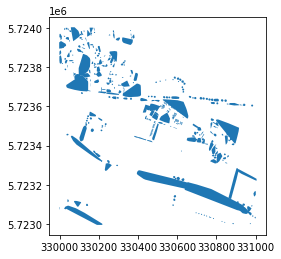

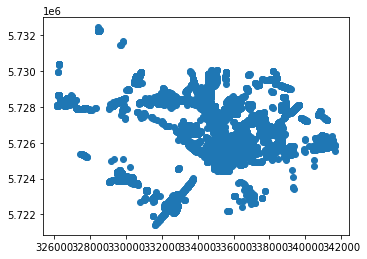

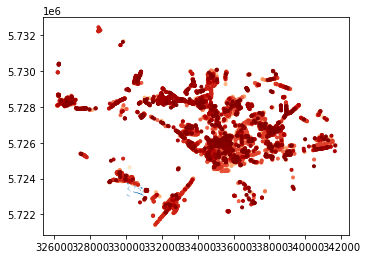

In [43]:
hulls_df.plot()
trees_df.plot()
ax = hulls_df.plot()
trees_df.plot(ax=ax,cmap='OrRd', marker='.')

,ID,X,Y,STADT,GATTUNG,LIDAR_FILE,coords,index_right,INDEX
1859,102892,330587.868716,5.723746e+06,3,116,57,POINT (330587.869 5723745.826),367,1799
1860,102896,330637.330994,5.723717e+06,3,116,57,POINT (330637.331 5723717.117),365,1795
1861,102899,330631.548557,5.723675e+06,3,116,57,POINT (330631.549 5723674.788),359,1784
1862,102905,330606.025631,5.723728e+06,3,2,57,POINT (330606.026 5723727.517),362,1791
1863,102906,330578.768854,5.723737e+06,3,2,57,POINT (330578.769 5723736.780),358,1783
1865,102910,330512.661015,5.723728e+06,3,2,57,POINT (330512.661 5723727.643),356,1777
1891,103032,330067.151156,5.723985e+06,3,2,57,POINT (330067.151 5723985.168),236,1293
4016,103030,330079.965140,5.723960e+06,3,16,57,POINT (330079.965 5723960.469),236,1293
7419,103031,330079.873507,5.723964e+06,3,2,57,POINT (330079.874 5723963.923),236,1293
7420,103033,330071.132012,5.723986e+06,3,2,57,POINT (330071.132 5723986.147),236,1293


<AxesSubplot:>

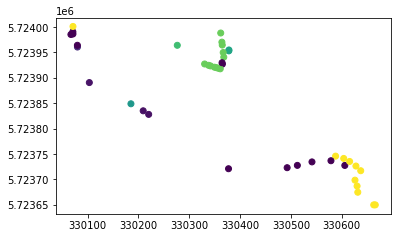

In [44]:
# map to kataster
intersections = geopandas.tools.sjoin(trees_df,hulls_df, op="intersects", how='inner') #intersects
#intersections2 = geopandas.tools.sjoin(hulls_df, trees_df, op="intersects", how='inner')  # nur zum plotten!

display(intersections)
intersections.plot(c=intersections.GATTUNG)

#ax = intersections2.plot()
#intersections.plot(ax=ax,c=intersections.GATTUNG)


367


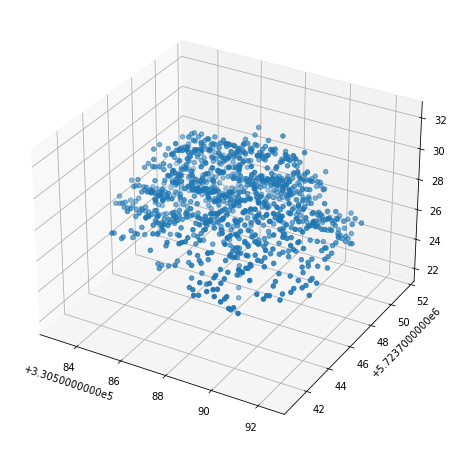

365


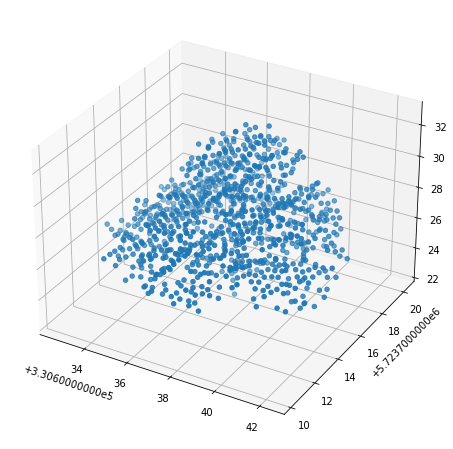

359


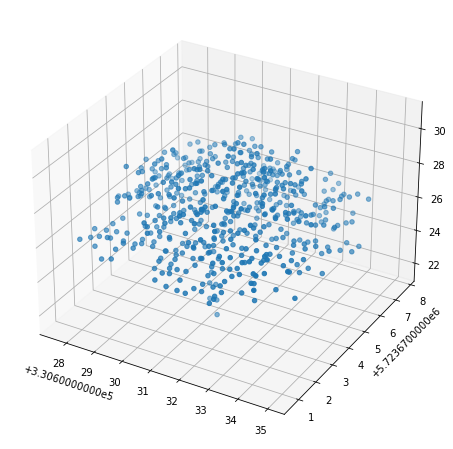

362


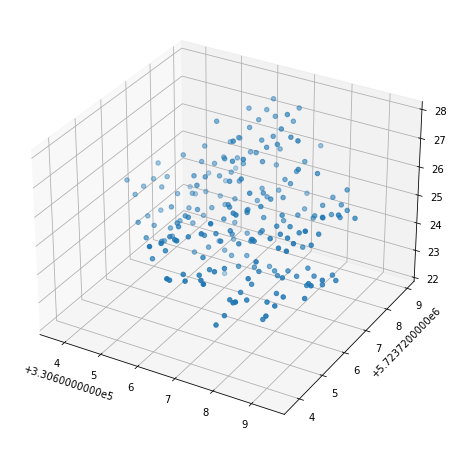

358


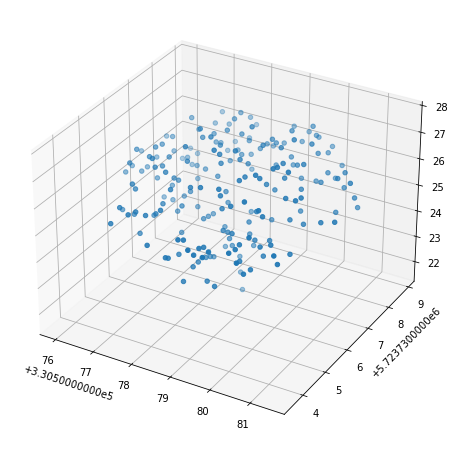

356


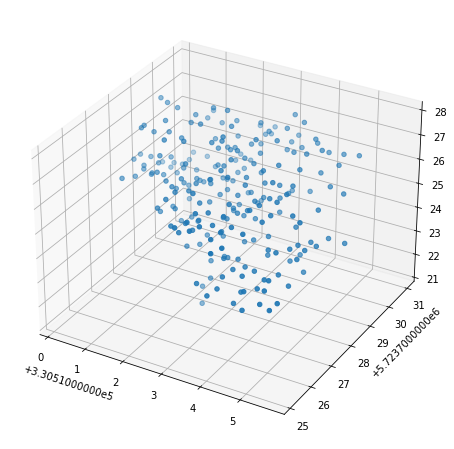

236


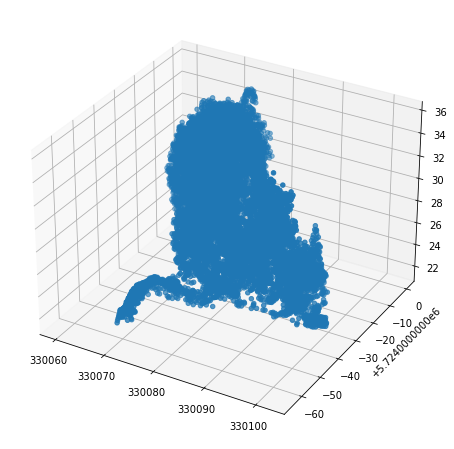

236


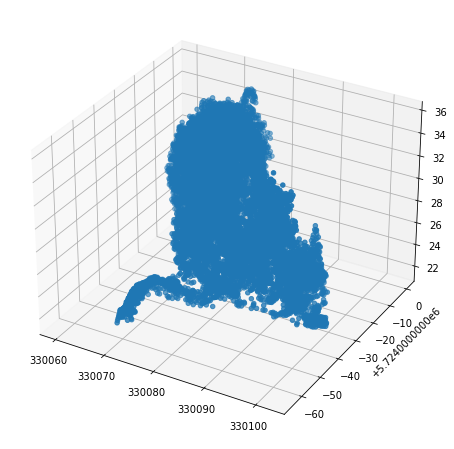

236


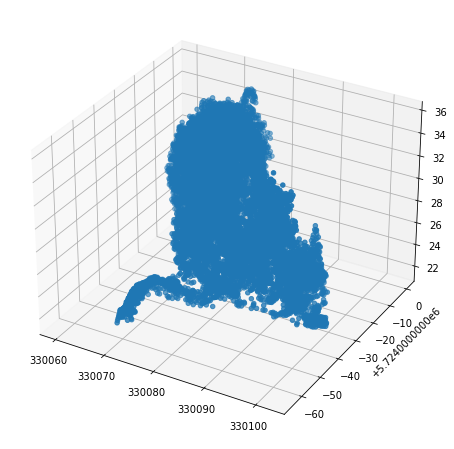

236


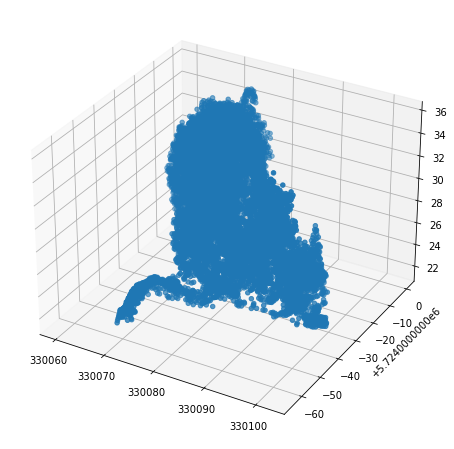

236


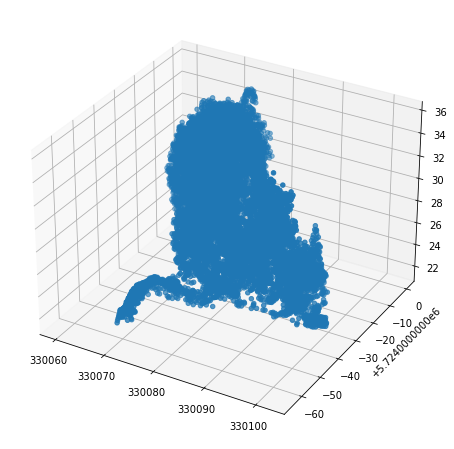

236


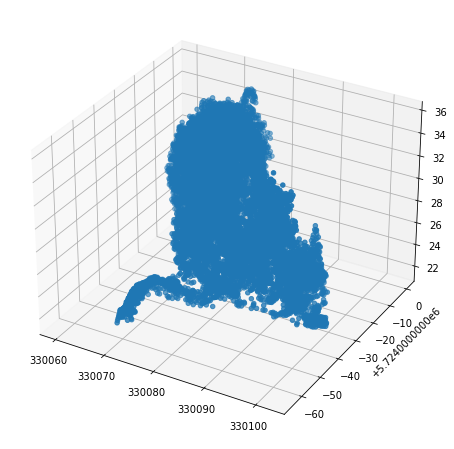

274


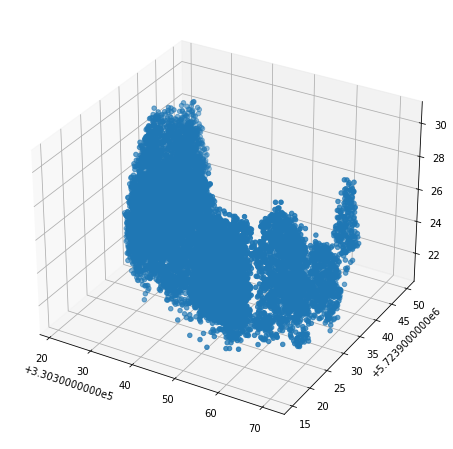

274


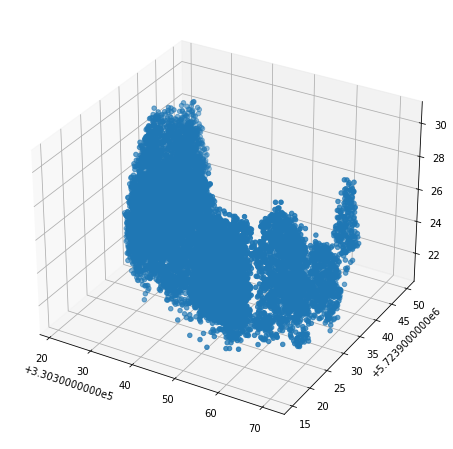

274


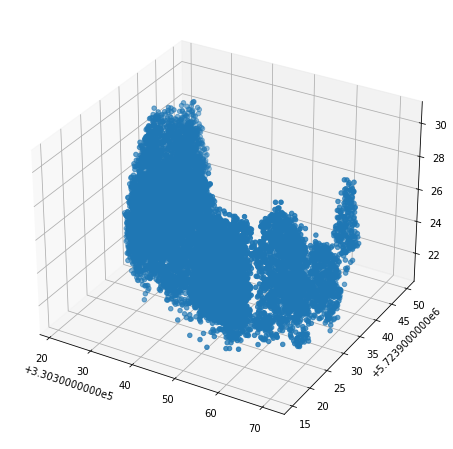

274


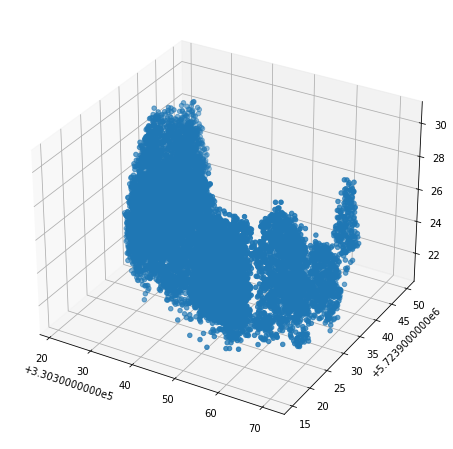

274


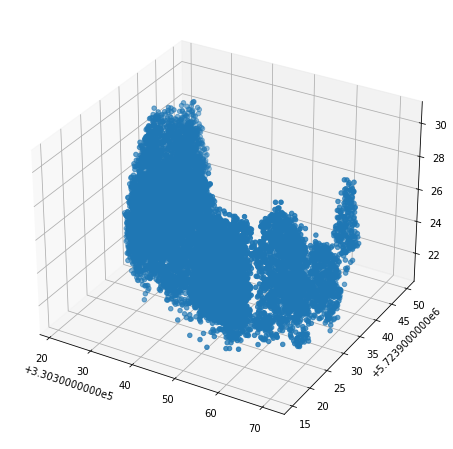

274


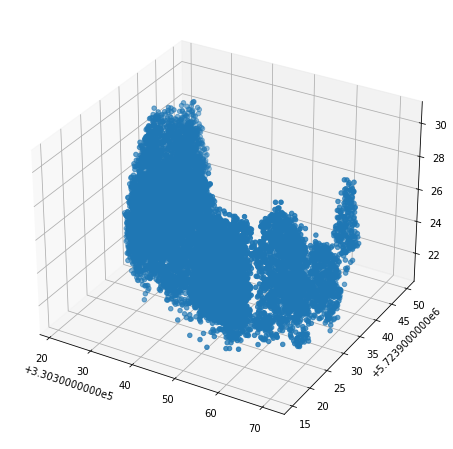

274


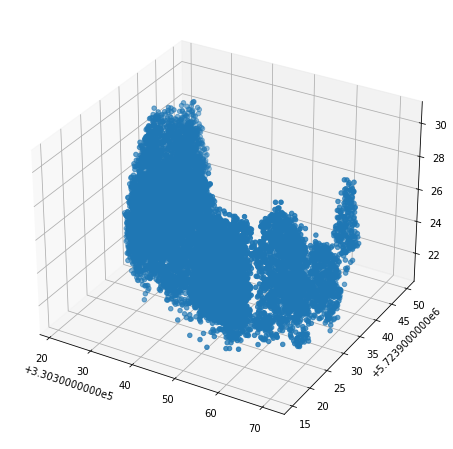

274


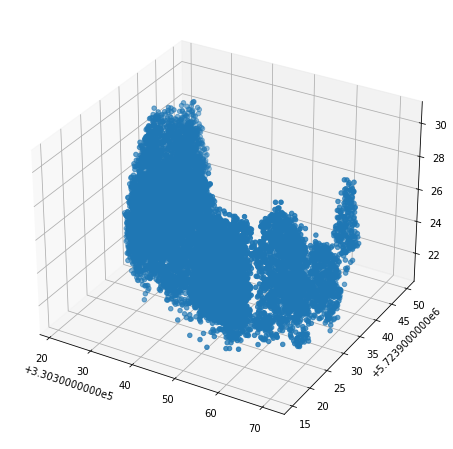

274


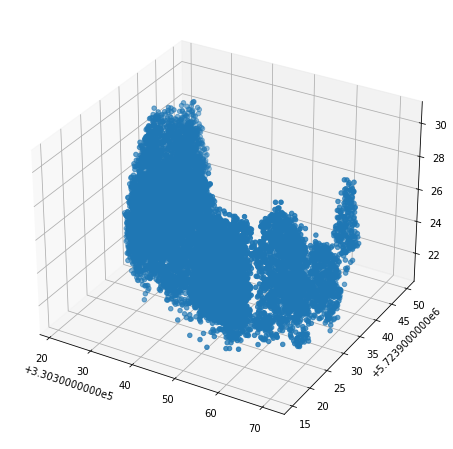

274


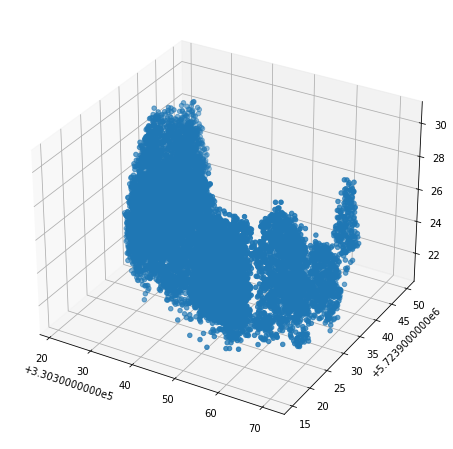

279


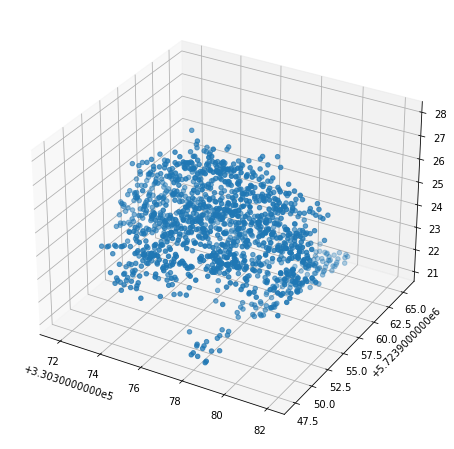

279


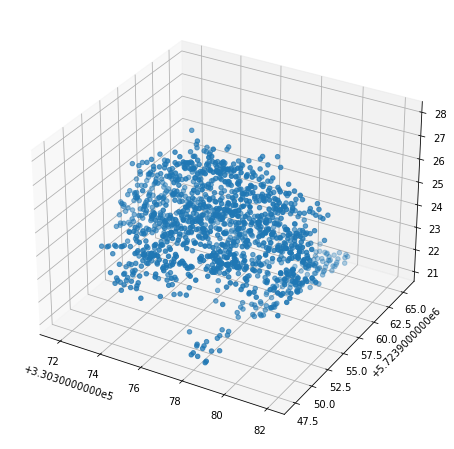

363


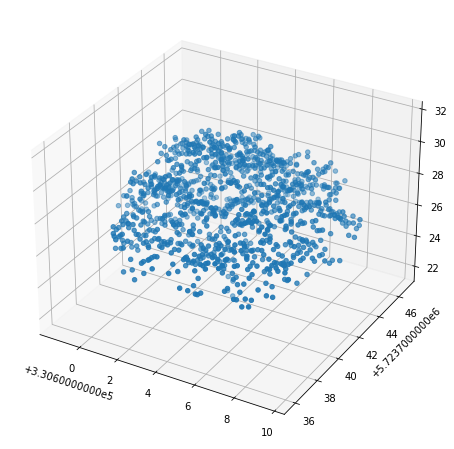

360


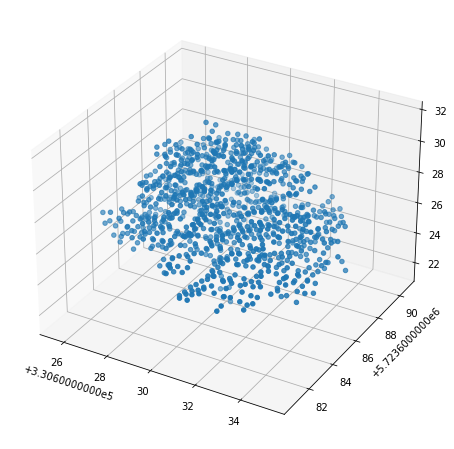

357


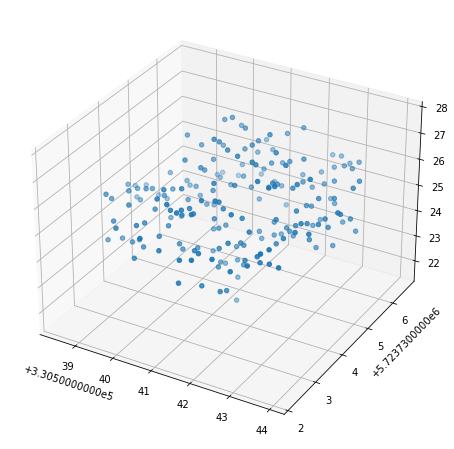

198


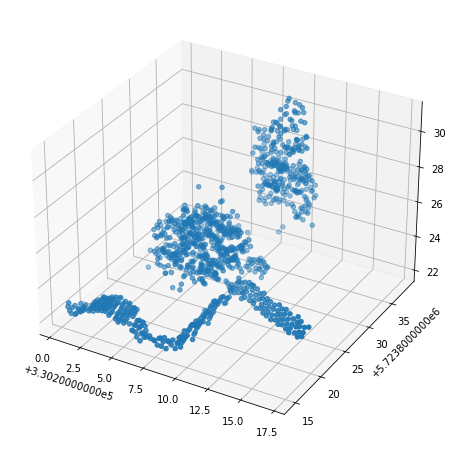

275


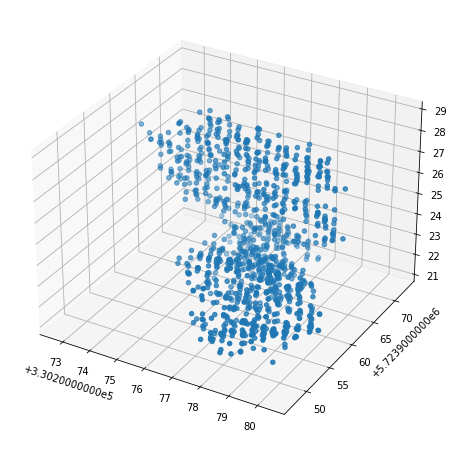

364


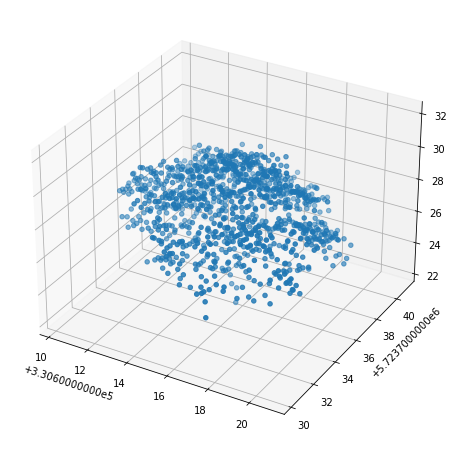

366


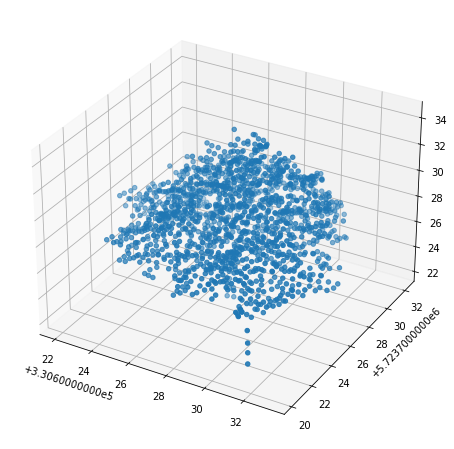

343


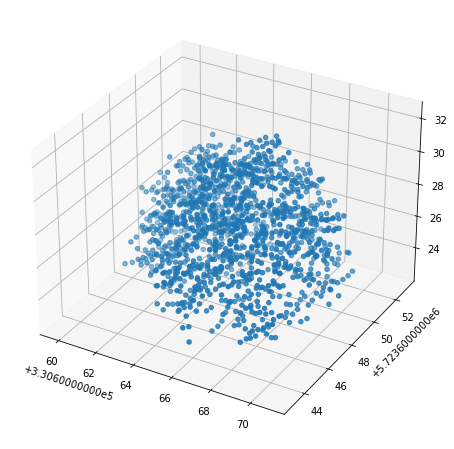

343


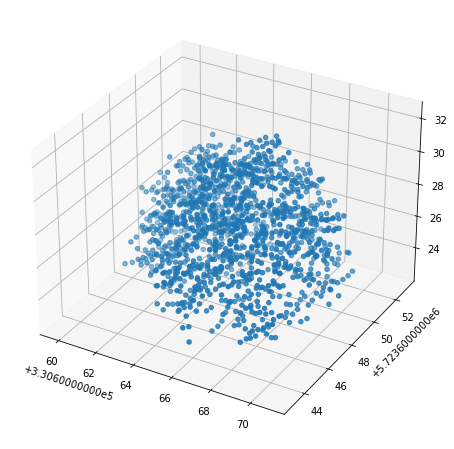

361


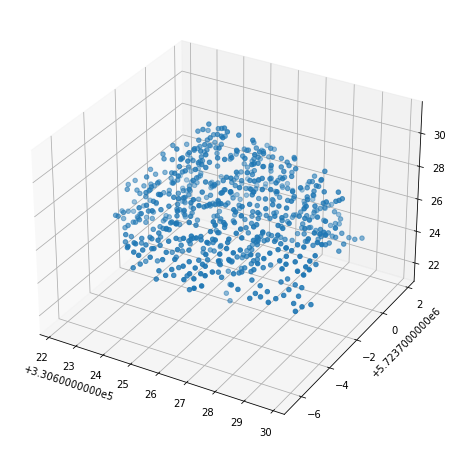

211


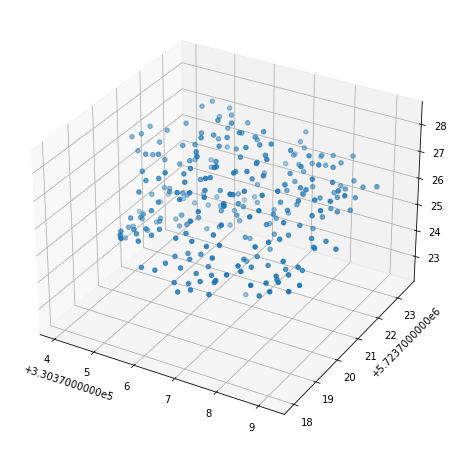

257


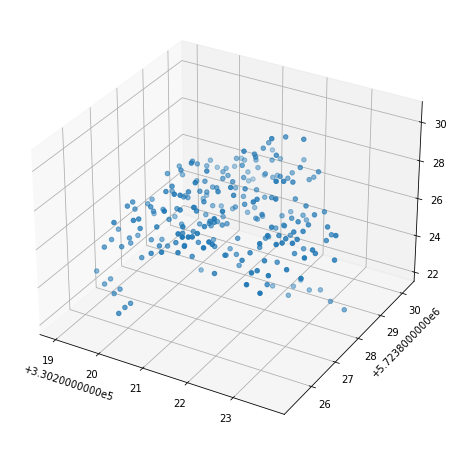

227


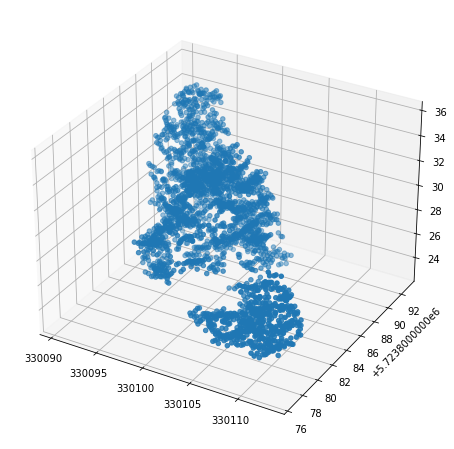

277


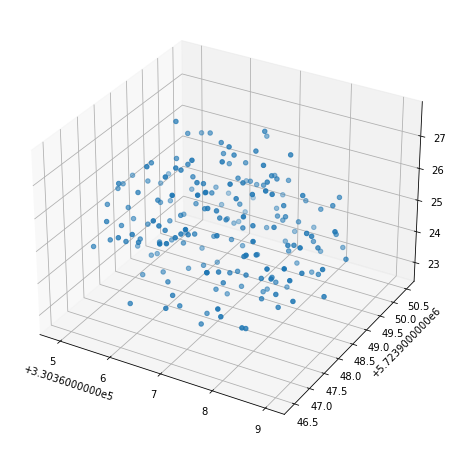

281


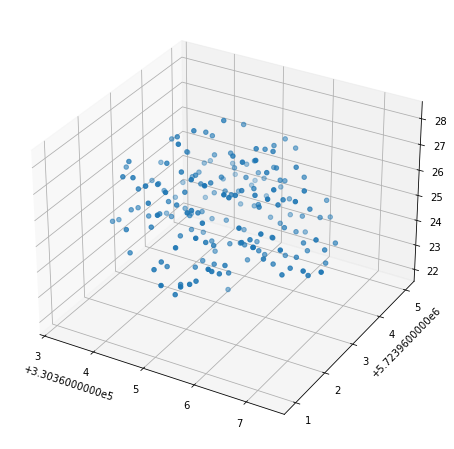

280


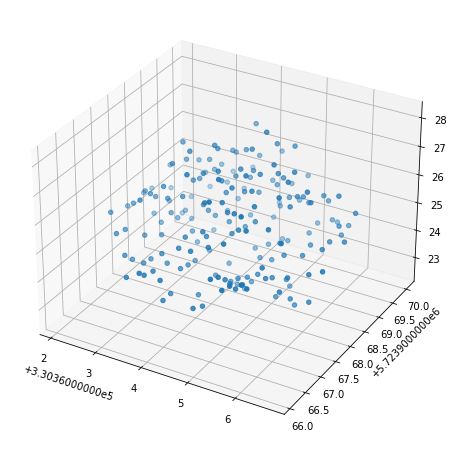

282


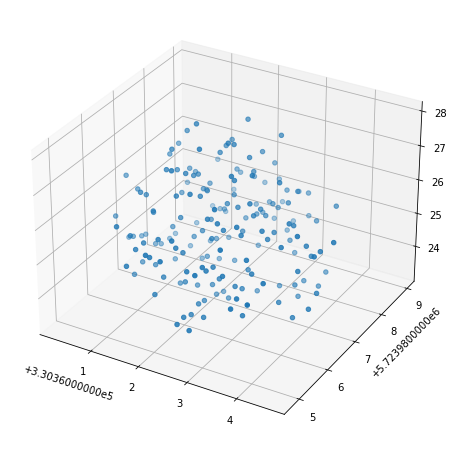

213


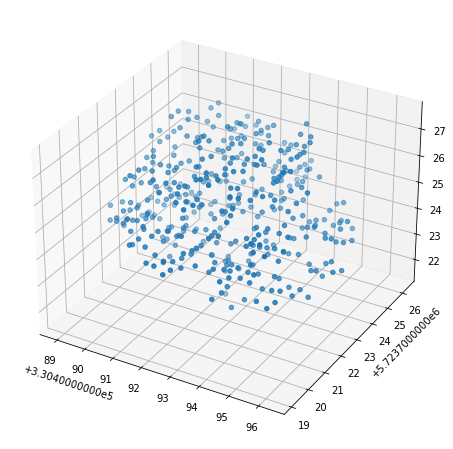

258


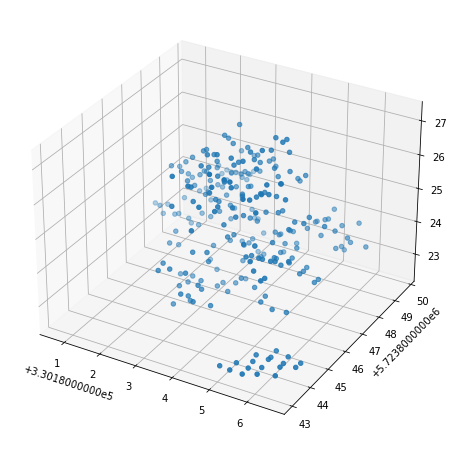

In [45]:
#print all clusters with kataster-match:

for i, row in intersections.iterrows():
        print(row.index_right)

        #hull = hull_dict[row.index_right]        
        points = cluster_dict[row.INDEX]
        x = [point[0] for point in points]
        y = [point[1] for point in points]
        z = [point[2] for point in points]

        #plt.scatter(xs, ys)
        fig = plt.figure(figsize=(8, 8))
        ax = fig.add_subplot(111, projection='3d')
        ax.scatter(x, y, z)
        plt.show()
        


In [71]:
print(len(intersections))
for i, row in intersections.iterrows():
    #print(row)
        cluster_key= row.index_right
        doubles = intersections.loc[intersections.index_right==cluster_key,:] 
        print(cluster_key)
        if (len(doubles) > 1):
            genus = []
            for i, row in doubles.iterrows():            
                genus.append(row.GATTUNG)
            #Prüfe: gibt es mehr als eine Gattungs-Zuordnung für diesen Cluster?
            print(genus)
            genus = set(genus)
            print(genus)
            if (len(genus) > 1):
                print('drop')
                #wenn ja, schmeisse ihn raus:
                intersections = intersections.drop(intersections[intersections.INDEX == cluster_key].index)
                
print(len(intersections))
                



    

43
367
365
359
362
358
356
236
[2, 16, 2, 2, 2, 116]
{16, 2, 116}
drop
236
[2, 16, 2, 2, 2, 116]
{16, 2, 116}
drop
236
[2, 16, 2, 2, 2, 116]
{16, 2, 116}
drop
236
[2, 16, 2, 2, 2, 116]
{16, 2, 116}
drop
236
[2, 16, 2, 2, 2, 116]
{16, 2, 116}
drop
236
[2, 16, 2, 2, 2, 116]
{16, 2, 116}
drop
274
[90, 90, 2, 90, 90, 90, 90, 90, 90, 2]
{90, 2}
drop
274
[90, 90, 2, 90, 90, 90, 90, 90, 90, 2]
{90, 2}
drop
274
[90, 90, 2, 90, 90, 90, 90, 90, 90, 2]
{90, 2}
drop
274
[90, 90, 2, 90, 90, 90, 90, 90, 90, 2]
{90, 2}
drop
274
[90, 90, 2, 90, 90, 90, 90, 90, 90, 2]
{90, 2}
drop
274
[90, 90, 2, 90, 90, 90, 90, 90, 90, 2]
{90, 2}
drop
274
[90, 90, 2, 90, 90, 90, 90, 90, 90, 2]
{90, 2}
drop
274
[90, 90, 2, 90, 90, 90, 90, 90, 90, 2]
{90, 2}
drop
274
[90, 90, 2, 90, 90, 90, 90, 90, 90, 2]
{90, 2}
drop
274
[90, 90, 2, 90, 90, 90, 90, 90, 90, 2]
{90, 2}
drop
279
[69, 69]
{69}
279
[69, 69]
{69}
363
360
357
198
275
364
366
343
[116, 116]
{116}
343
[116, 116]
{116}
361
211
257
227
277
281
280
282
213
258
43


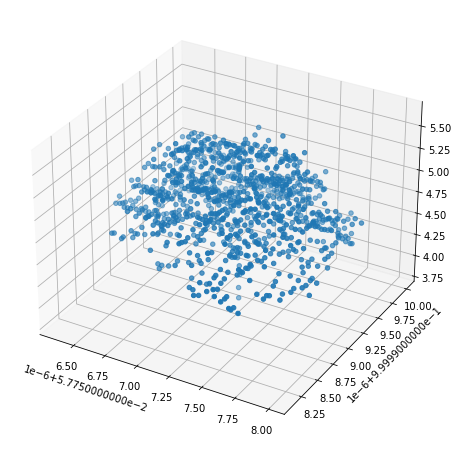

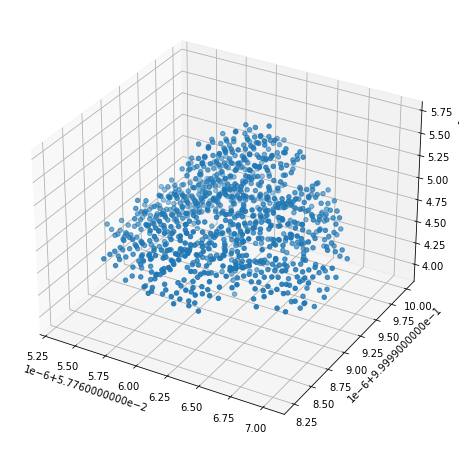

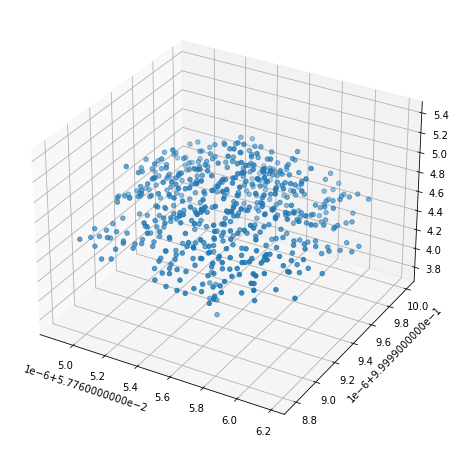

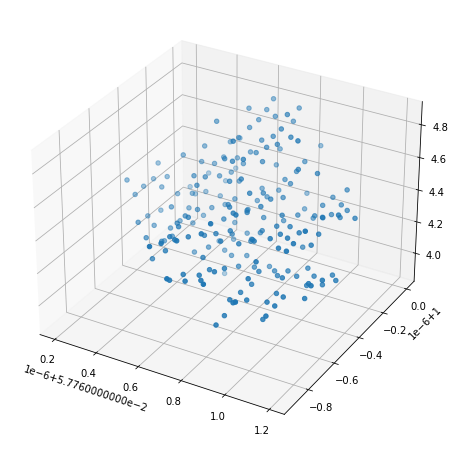

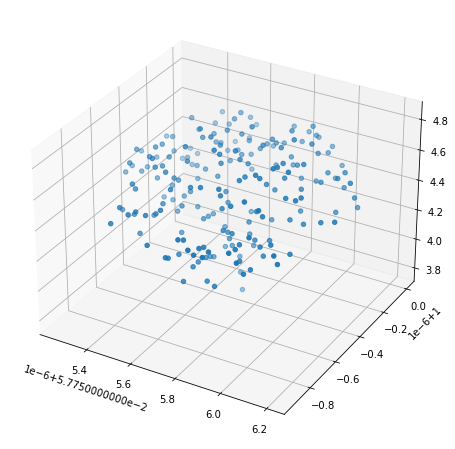

...

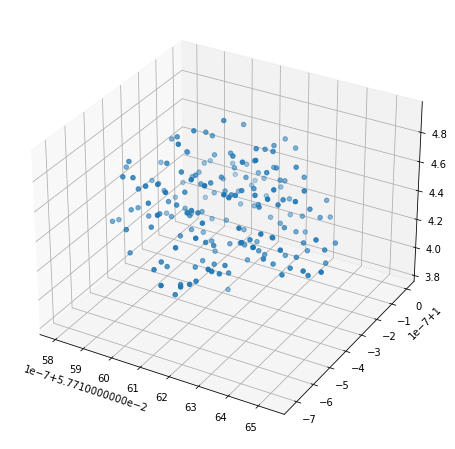

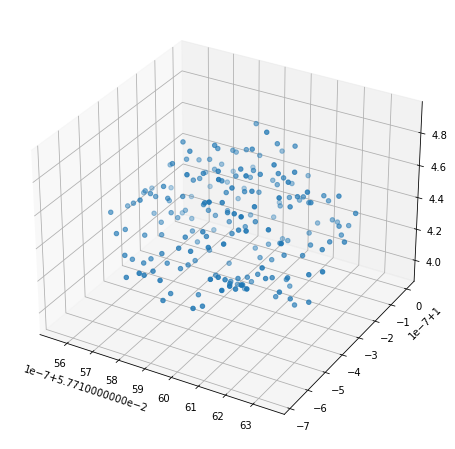

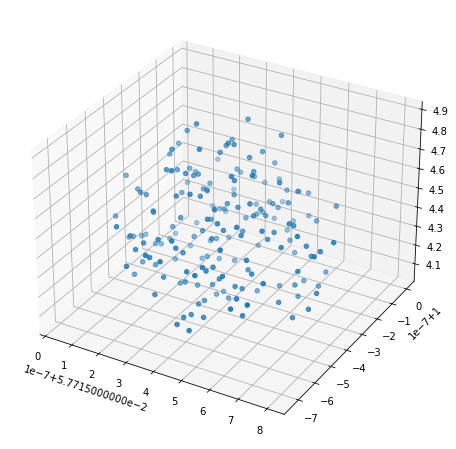

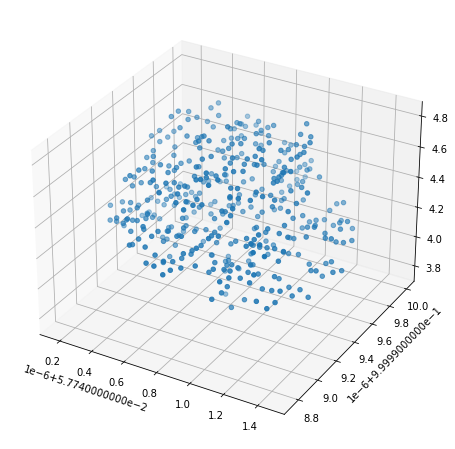

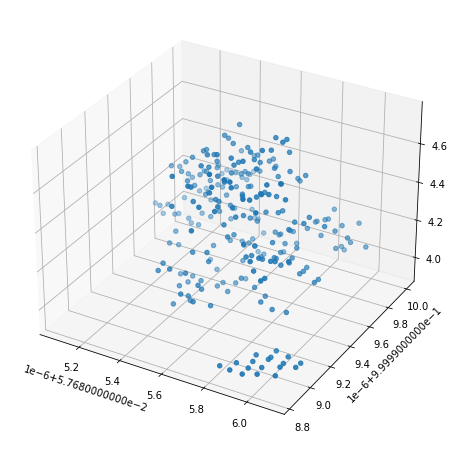

In [64]:
#scale 0:1
normalized_trees = {}
for i, row in intersections.iterrows():
    points = numpy.array(cluster_dict[row.INDEX])
    points = points/ numpy.max(points)
    x = [point[0] for point in points]
    y = [point[1] for point in points]
    z = [point[2] for point in points]

    #plt.scatter(xs, ys)
    fig = plt.figure(figsize=(8, 8))
    ax = fig.add_subplot(111, projection='3d')
    ax.scatter(x, y, z)
    plt.show()
    normalized_trees[row.INDEX] = points

    

    


In [47]:
#save
#dabei die z koordiante nicht vergessen, die muss ganz oben aus dem cluster_dict geholt werden!